In [191]:
import os

if not os.path.exists('thinkdsp.py'):
    !wget https://github.com/AllenDowney/ThinkDSP/raw/master/code/thinkdsp.py

# Упражнение 1.2

Скачайте с сайта http://freesound.org включающий музыку, речь или иные звуки,имеющие чётко выраженныую высоту. Выделите примерно получекундный сегмент, в котором высота постоянна. Вычислите и распечатайте спектр выбранного сегмента.

Как связаны тембр звука и гармоническая структура, видимая в спектре.
Используйте *high_pass*, *low_pass* и *band_stop* для фильтрации тех или иных гармоник. Затем преобразуйте спектр обратно в сигнал и прослушайте его. Как звук соотносится с изменениями, сделанными в спектре?

В качестве образца была взята одноголосая электронная мелодия

In [192]:
from thinkdsp import read_wave

if not os.path.exists('melody.wav'):
    !wget https://github.com/Ch0rtik/telecom/raw/main/chap_01/melody.wav

filename = 'melody.wav'
sample = read_wave(filename)
sample.make_audio()

Был взят сегмент из самого начала файла, в котором ясно слышна одна нота

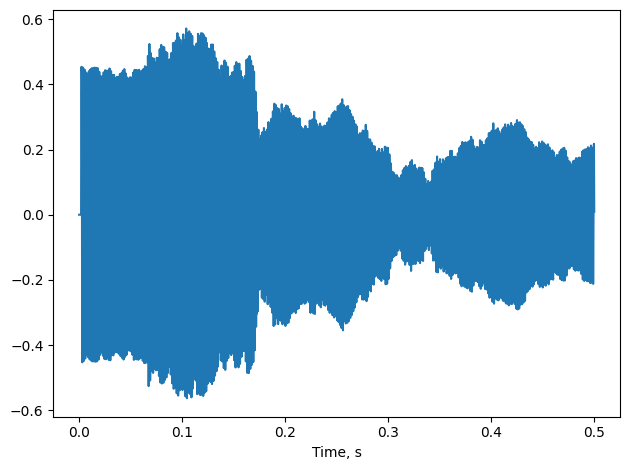

In [193]:
from thinkdsp import decorate
start = 0.0
duration = 0.5
segment = sample.segment(start, duration)
segment.plot()
decorate(xlabel='Time, s')
segment.make_audio()

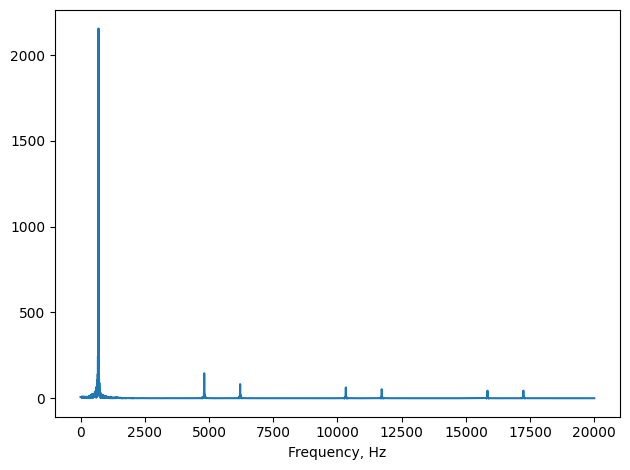

In [194]:
spectrum = segment.make_spectrum()
spectrum.plot(high=20000)
decorate(xlabel='Frequency, Hz')

На спетрограмме видно, что звук имеет ярко выраженную фундаментальную частоту, придающую высоту сигналу в сегменте, а также менее выраженные гармоники, отвечающие за тембр звука.

Попробуем с помощью high_pass, low_pass и band_stop "вырезать" одну из слабых частот сигнала.

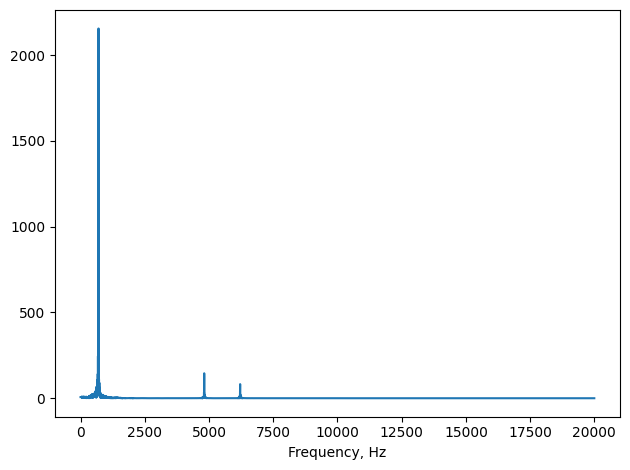

In [195]:
spectrum.low_pass(10000)
spectrum.plot(high=20000)
decorate(xlabel='Frequency, Hz')

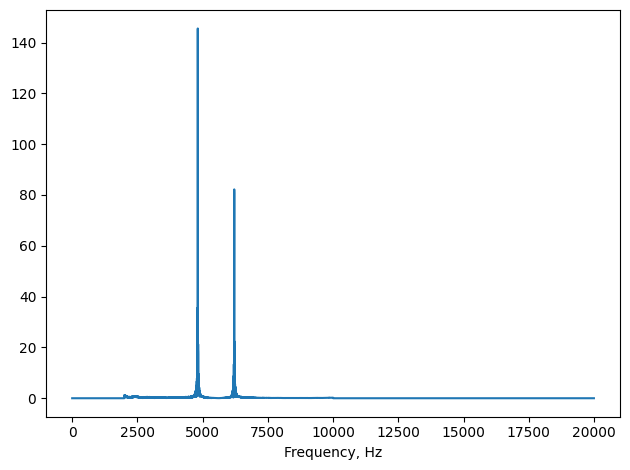

In [196]:
spectrum.high_pass(2000)
spectrum.plot(high=20000)
decorate(xlabel='Frequency, Hz')

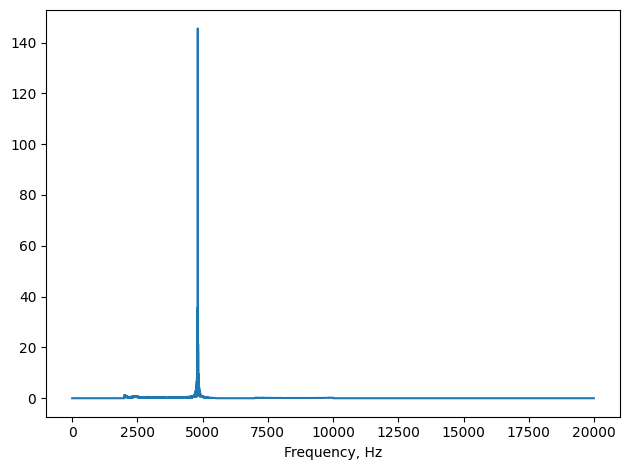

In [197]:
spectrum.band_stop(5500, 7000)
spectrum.plot(high=20000)
decorate(xlabel='Frequency, Hz')

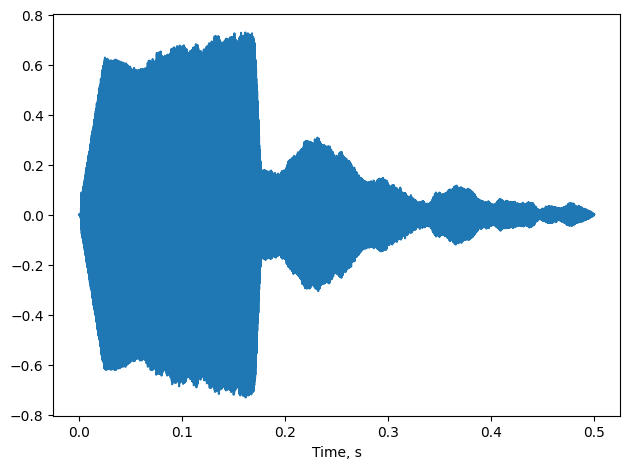

In [198]:
filtered = spectrum.make_wave()
filtered.normalize()
filtered.apodize()
filtered.plot()
decorate(xlabel='Time, s')

Сравнение изначального и итогового сегментов.

In [199]:
segment.make_audio()

In [200]:
filtered.make_audio()

Достаточно очевиден вывод, что итоговая запись значительно отличается по тембру и имеет более высокую воспринимаемую частоту, в связи с удалением остальных частот.

In [201]:
filtered.write('filtered-result.wav')

Writing filtered-result.wav


# Упражнение 1.3

Создайте сложный сигнал из объектов *SinSignal* и *CosSignal* суммируя их. Обработайте сигнал для получения wave и прослушайте его. Вычислите Spectrum и распечатайте. Что произойдёт при добавлении частотных компонент, не кратных основным?

Попытаемся сделат из четырёх частот гармонический септаккорд – частоты его составляющих находятся в "красивых" соотношениях по отношению к фундаментальной частоте.

In [202]:
from thinkdsp import CosSignal, SinSignal

first = SinSignal(freq=800, amp=2.0, offset=0)
third = SinSignal(freq=800*5/4, amp=2.5, offset=0)
fifth = SinSignal(freq=800*6/4, amp=1.5, offset=0)
seventh = SinSignal(freq=800*7/4, amp=3.5, offset=0)

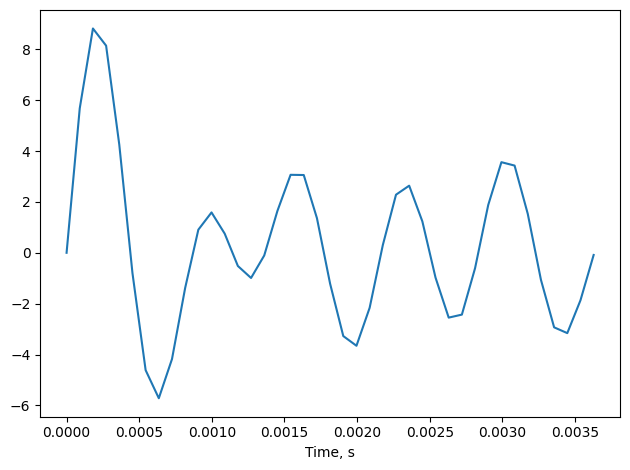

In [203]:
chord = first + third + fifth + seventh
chord.plot()
decorate(xlabel='Time, s')

In [204]:
wave = chord.make_wave(duration=1.5, start=0, framerate=11025)
wave.make_audio()

Некратное соотношение частот приводит к диссонансу, но диссонанс и есть причина того, почему набор сигналов начинает звучать как аккорд.

Но даже несмотря на это, общее звучание аккорда остаётся неясным. Причину этому можно увидеть на спектрограмме:

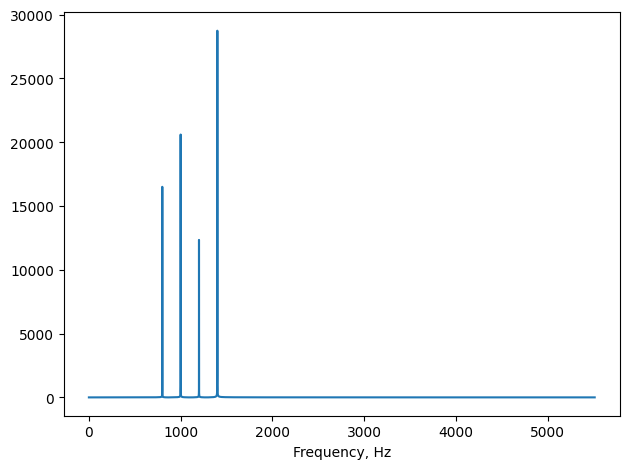

In [205]:
spectrum = wave.make_spectrum()
spectrum.plot()
decorate(xlabel='Frequency, Hz')

Так как каждая нота аккорда состоит только из фундаментальной частоты, каждая из нот воспринимается человеческим ухом очень слабой, из-за чего и не получается уловить ясное звучание аккорда.

# Упражнение 1.4

Напишите функцию stretch, берущую wave и коэффициент изменения. Она должна ускорять или замедлять сигнал изменением ts и framerate. Подсказка: должно получиться всего две строки кода.

In [206]:
def stretch(wave, stretch_coefficient):
  wave.ts *= stretch_coefficient
  wave.framerate /= stretch_coefficient

In [207]:
stretch(sample, 3.0)

Проверка на фрагменте из пункта 1.2

In [208]:
sample.make_audio()